In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.ndimage as nd
from scipy.stats import lognorm
from skimage.morphology import remove_small_objects, medial_axis
from astropy.io import fits
from astropy.table import Table, Column
from astropy import units as u
from astropy.wcs import WCS
from astropy.nddata.utils import overlap_slices
from copy import deepcopy
import os
import time
import warnings
from PIL import Image
import glob

In [2]:
arr_1 = np.load("/home/filament/Downloads/semantic_segmentation/data/VOCdevkit/VOC2012/fil_norm_data/taurus_%s.npy"%i)
arr_2 = np.load("/home/filament/Downloads/semantic_segmentation/data/VOCdevkit/VOC2012/filament_taurus_datasets_grey_arcnorm_array/taurus_%s.npy"%i)

/home/filament/.pyenv/versions/3.7.11/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


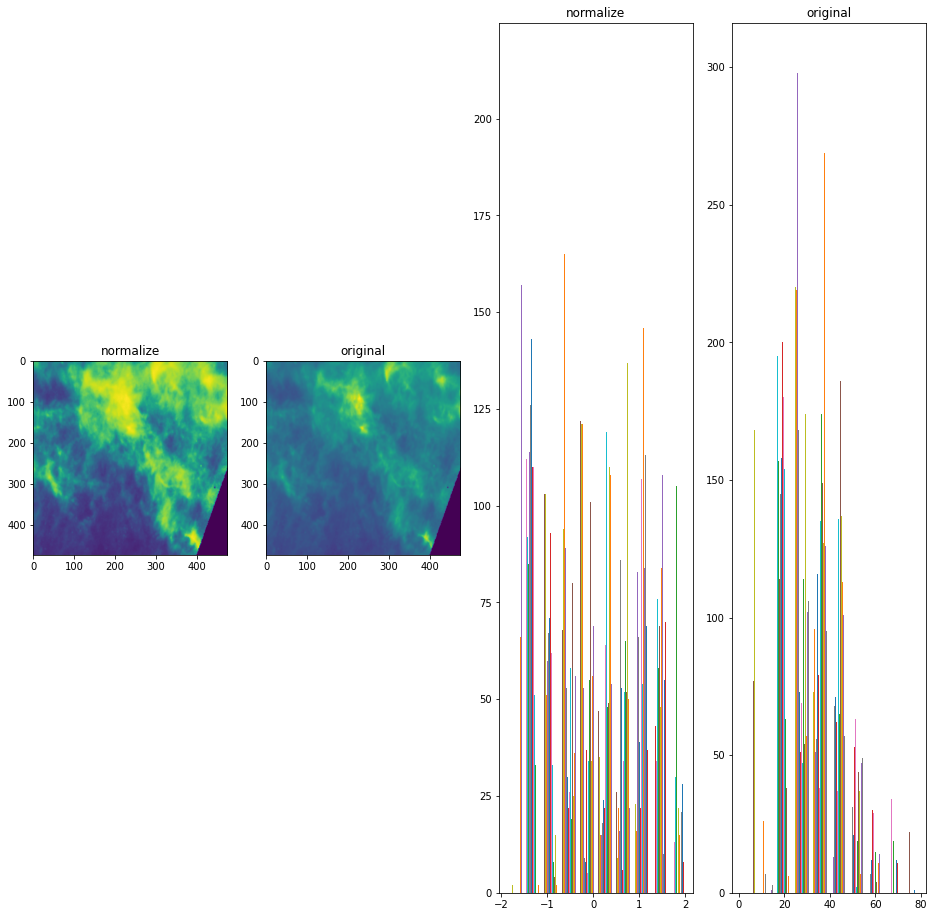

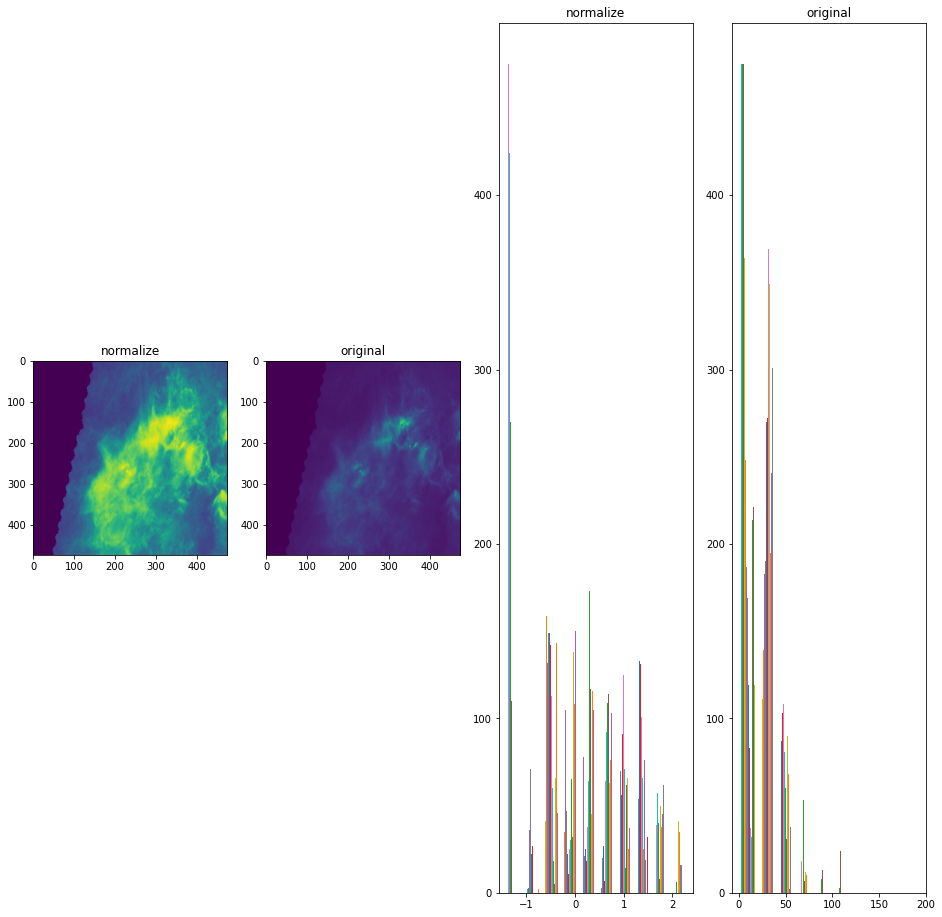

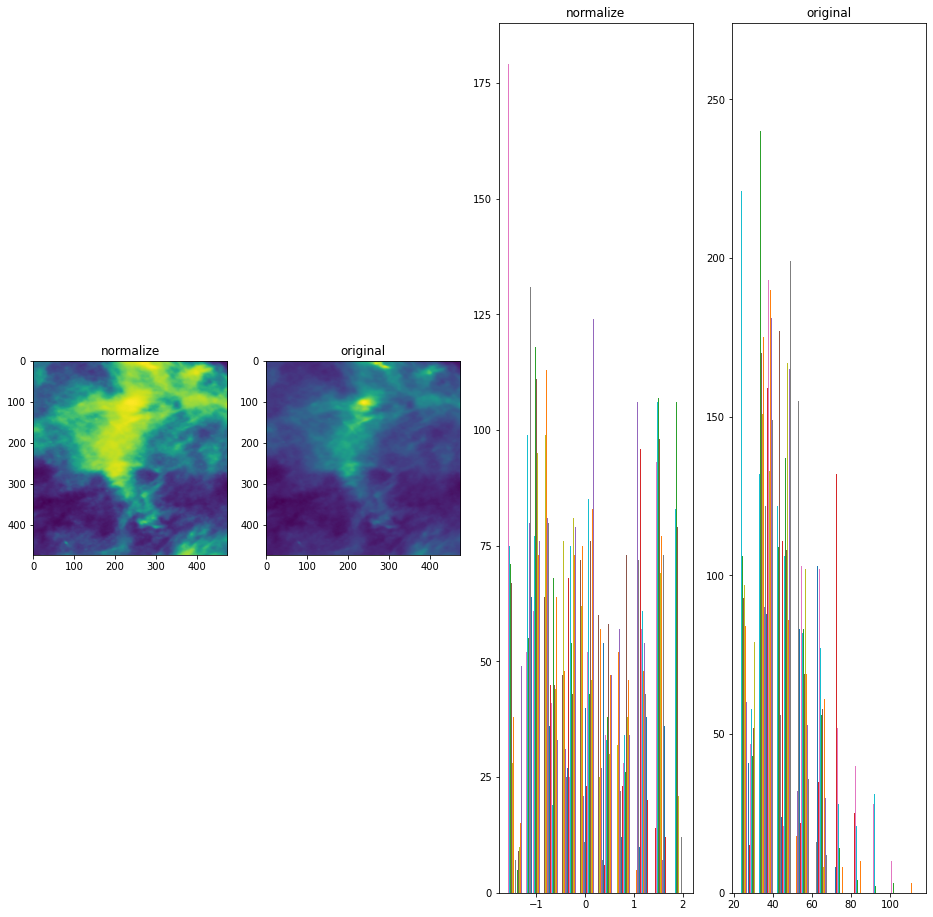

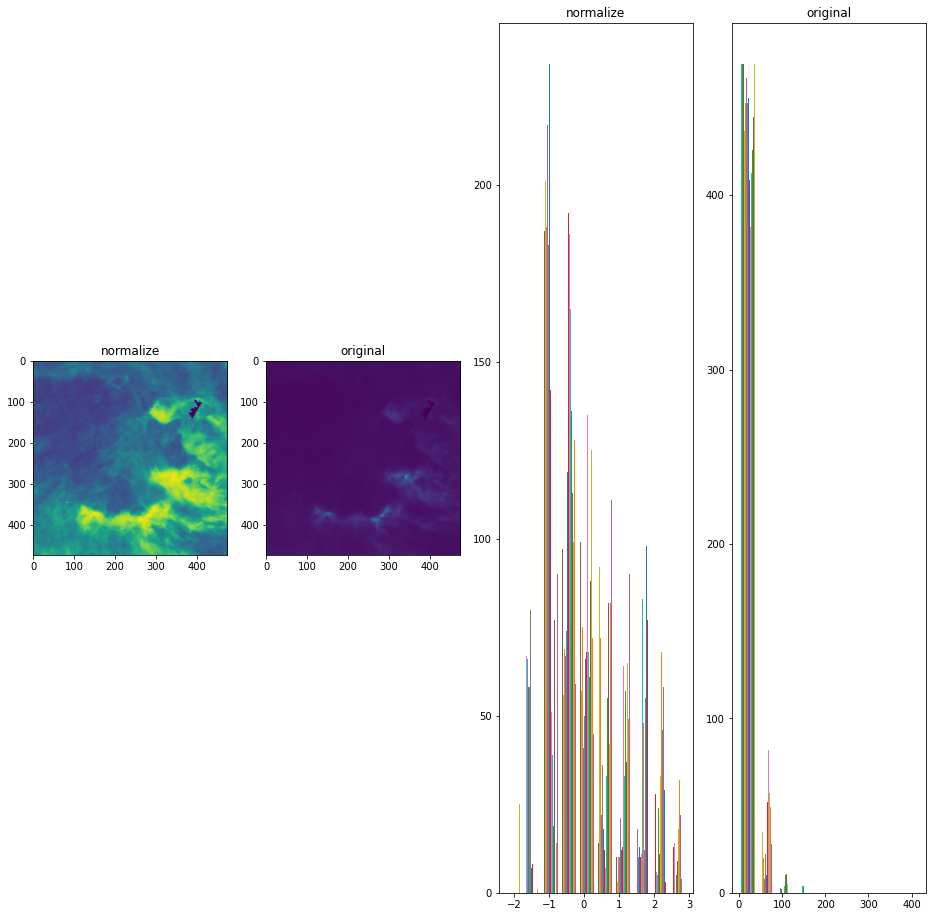

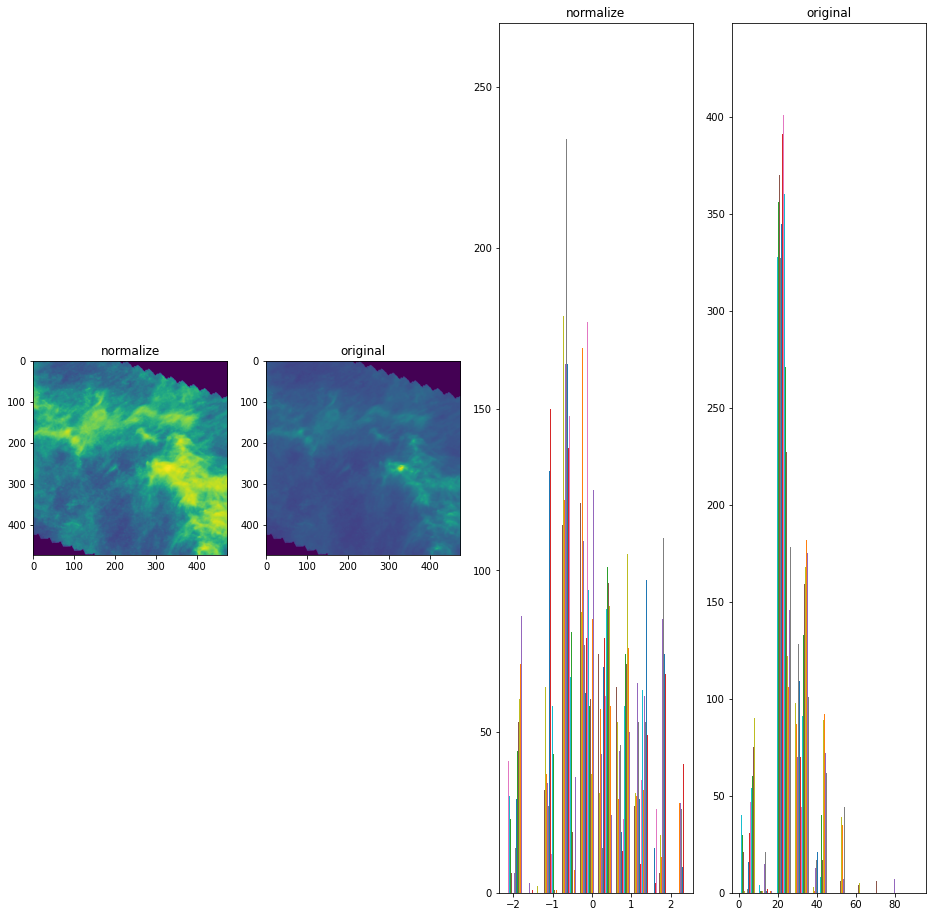

...

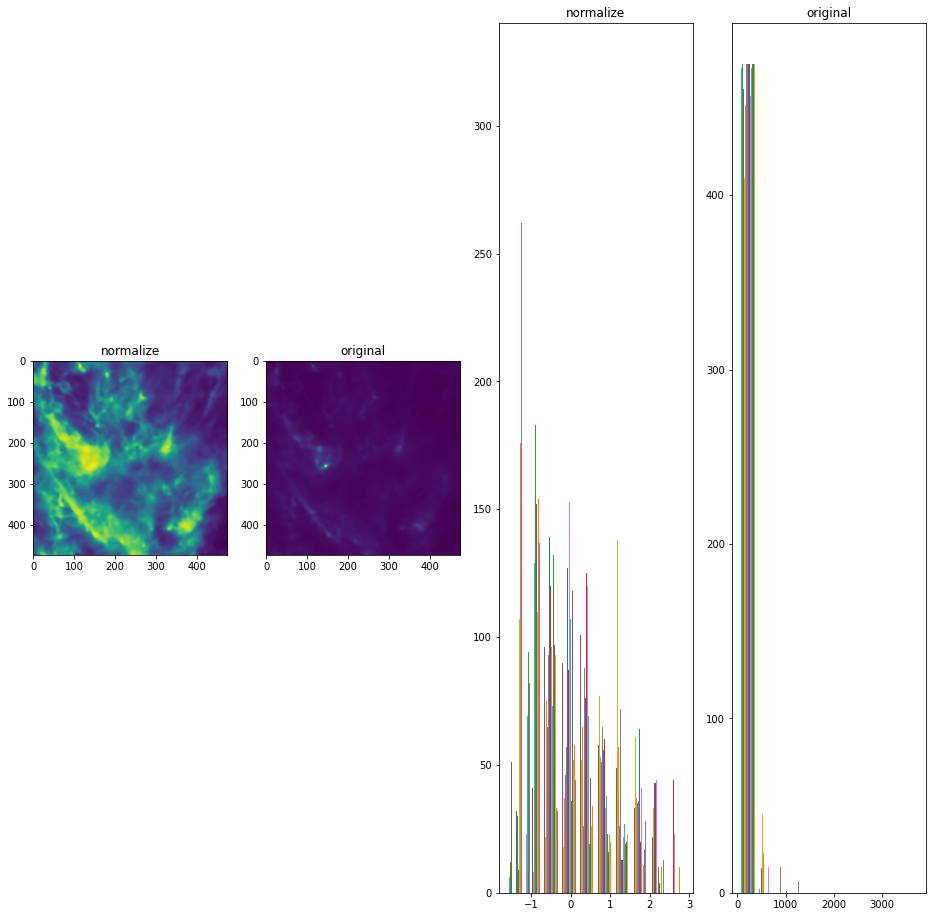

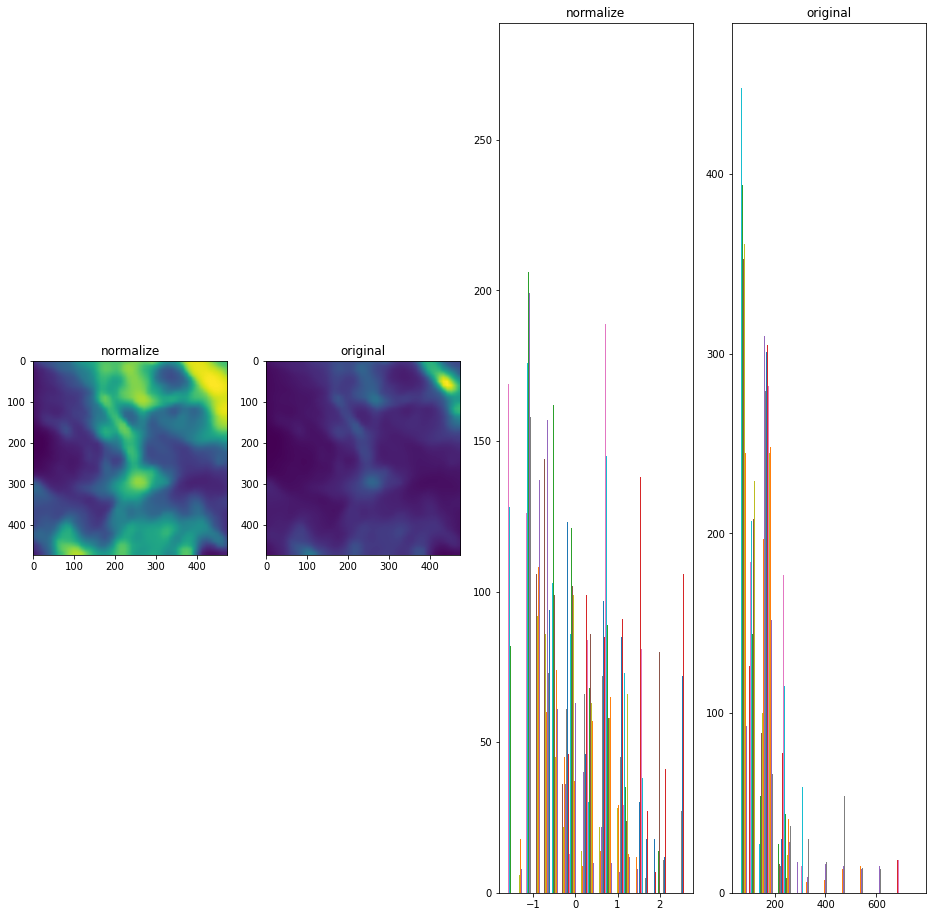

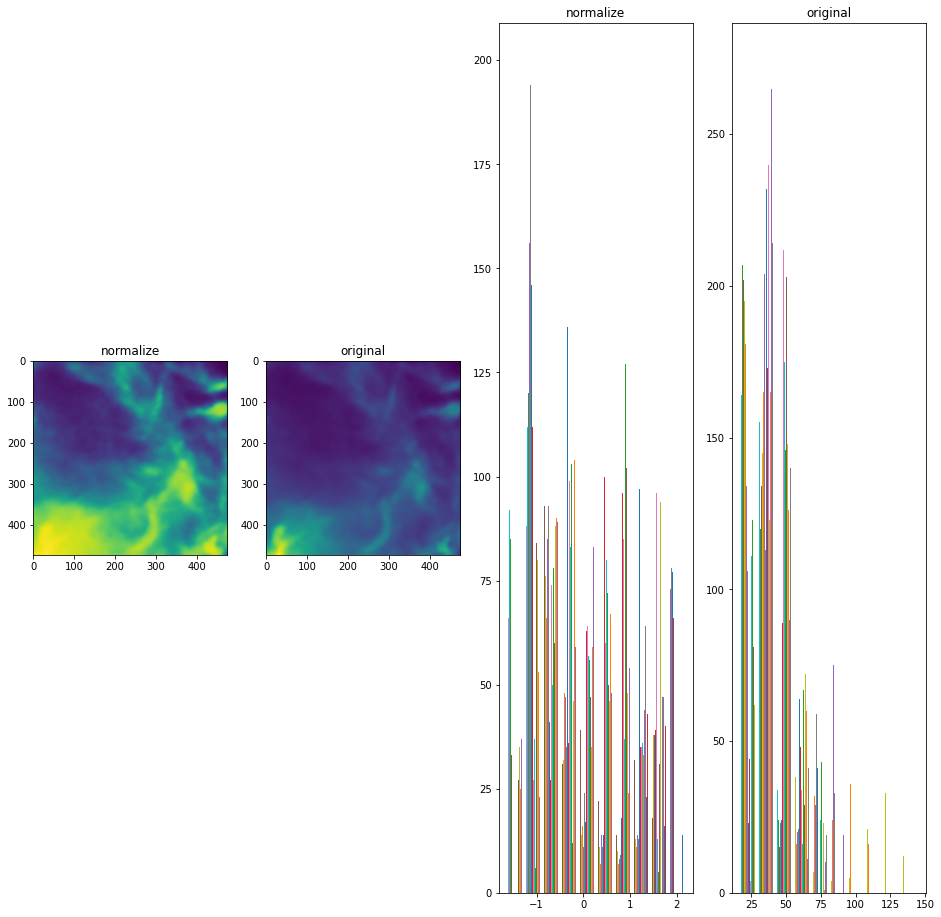

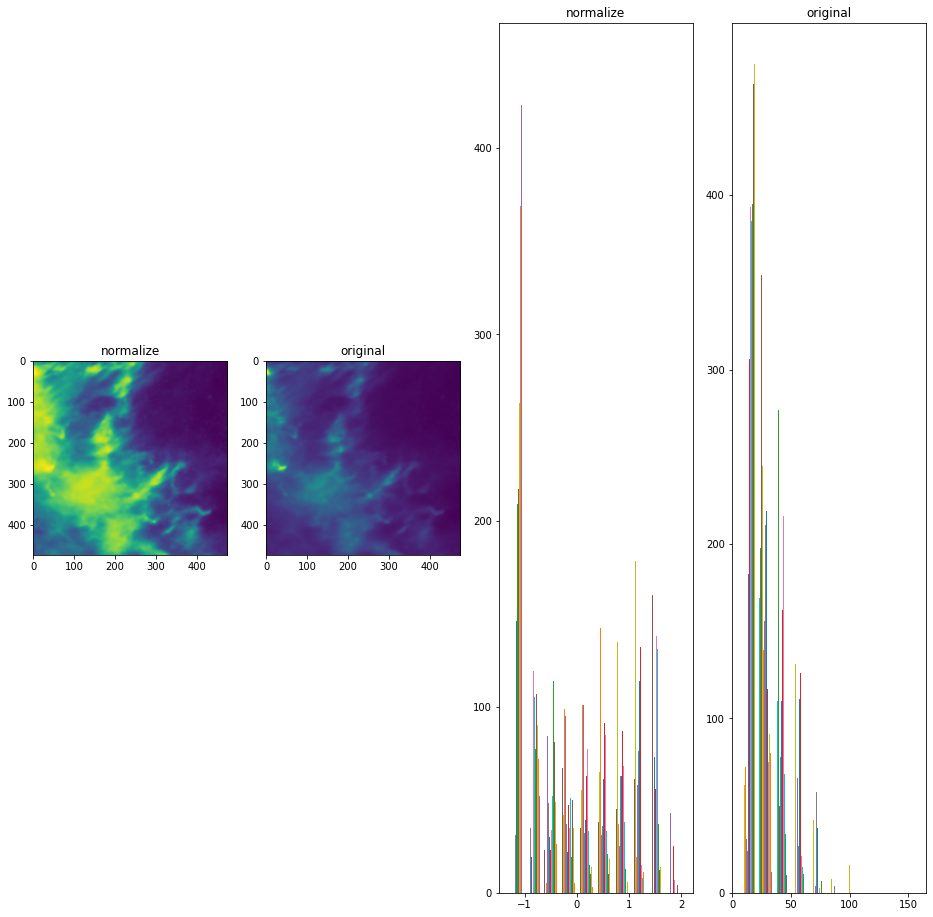

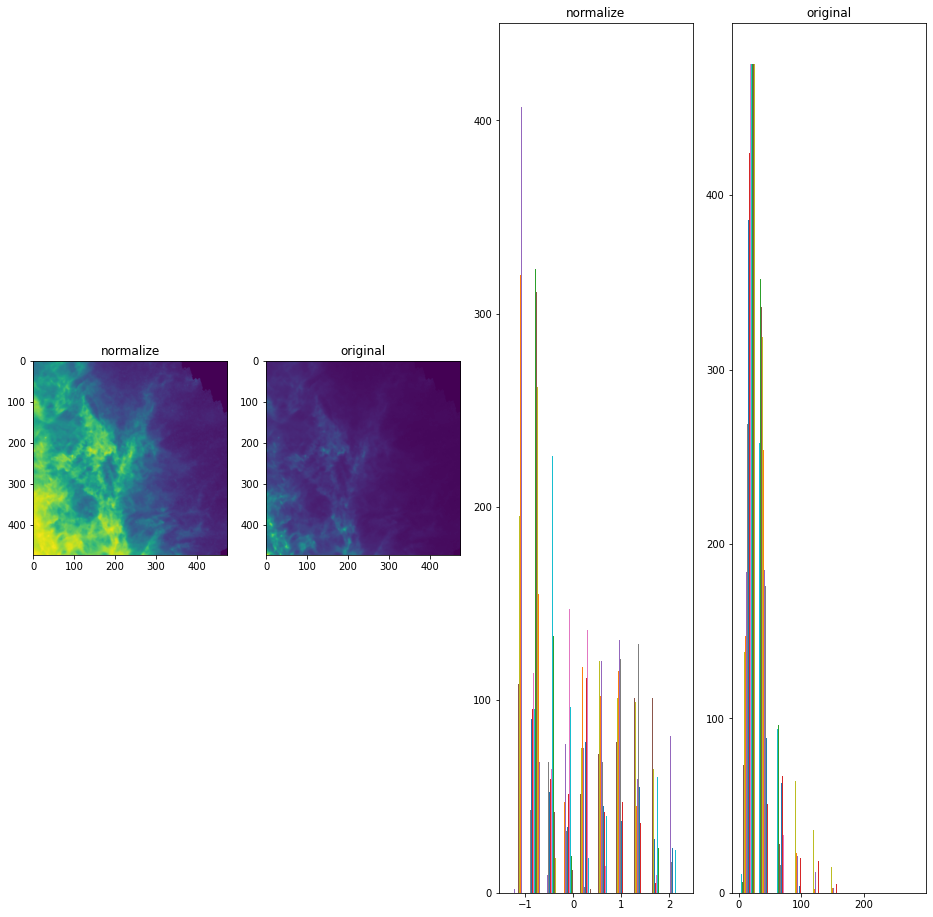

In [9]:
for i in range(1,45):   
    arr_1 = np.load("/home/filament/Downloads/semantic_segmentation/data/VOCdevkit/VOC2012/fil_norm_data/taurus_%s.npy"%i)
    arr_2 = np.load("/home/filament/Downloads/semantic_segmentation/data/VOCdevkit/VOC2012/filament_taurus_datasets_grey_arcnorm_array/taurus_%s.npy"%i)
    fig,ax = plt.subplots(1,4,figsize=(16,16))
    ax[0].imshow(arr_1)
    ax[0].set_title("normalize")
    ax[1].imshow(arr_2)
    ax[1].set_title("original")

    ax[2].hist(arr_1)
    ax[2].set_title("normalize")
    ax[3].hist(arr_2)
    ax[3].set_title("original")

In [7]:
np.median(np.float32(arr_2))
np.log(arr_2)

/home/filament/.pyenv/versions/3.7.11/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log
  


array([[     -inf, 1.3409221, 2.7760065, ..., 2.9848554, 2.9826064,
        2.9819028],
       [     -inf, 1.344069 , 2.7791536, ..., 2.9595904, 2.9575443,
        2.9569042],
       [     -inf, 1.3498759, 2.7849605, ..., 2.9256272, 2.9234543,
        2.9227743],
       ...,
       [     -inf,      -inf,      -inf, ..., 3.355552 , 3.3676713,
        3.3714285],
       [     -inf,      -inf,      -inf, ..., 3.371256 , 3.3790352,
        3.381454 ],
       [     -inf,      -inf,      -inf, ..., 3.381327 , 3.384877 ,
        3.3859837]], dtype=float32)

In [10]:
arr_2

array([[ 0.       ,  3.8225665, 16.05478  , ..., 19.78364  , 19.7392   ,
        19.725313 ],
       [ 0.       ,  3.8346148, 16.105383 , ..., 19.29007  , 19.25064  ,
        19.238321 ],
       [ 0.       ,  3.856947 , 16.199179 , ..., 18.64592  , 18.605444 ,
        18.592796 ],
       ...,
       [ 0.       ,  0.       ,  0.       , ..., 28.661417 , 29.01089  ,
        29.120098 ],
       [ 0.       ,  0.       ,  0.       , ..., 29.115074 , 29.342451 ,
        29.413506 ],
       [ 0.       ,  0.       ,  0.       , ..., 29.409767 , 29.514359 ,
        29.54704  ]], dtype=float32)

In [3]:
files = glob.glob("/home/filament/Downloads/semantic_segmentation/data/VOCdevkit/VOC2012/filament_taurus_datasets_grey_arcnorm_array/*.npy")
files[0].split("/")[9]

'taurus_1.npy'

In [4]:
arr_2 = np.load(files[0])

In [7]:
np.mean(arr_2)

31.703344

/home/filament/.pyenv/versions/3.7.11/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


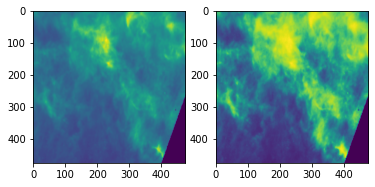

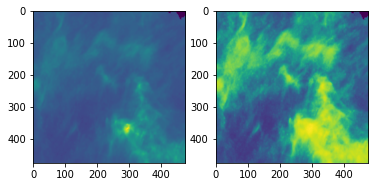

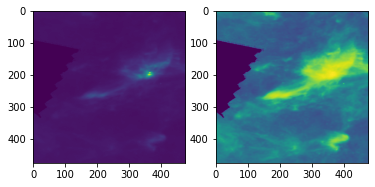

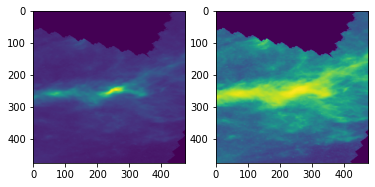

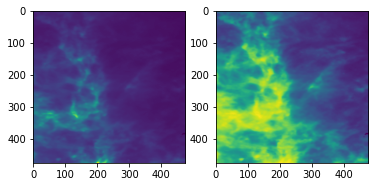

...

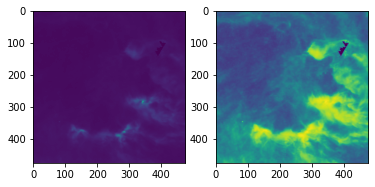

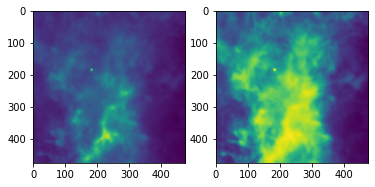

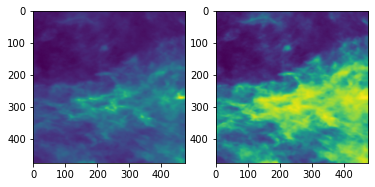

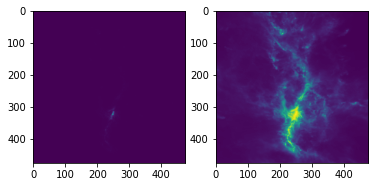

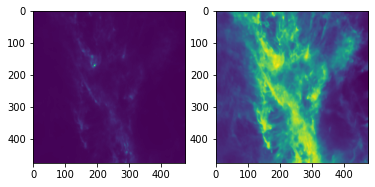

In [8]:
for file in files:
    
    arr_name = file.split("/")[9]
    
    arr = np.load(file)
    arr = np.array(arr, dtype = np.float32)
    
    
    # log_arr = np.log(arr)
    median = np.median(arr)
    mean = np.mean(arr)
    std = np.std(arr)
    
    arctan_arr = np.arctan((arr - median)/std)
    
    norm_arr = (arctan_arr - np.mean(arctan_arr))/np.std(arctan_arr)
    
    fig,ax = plt.subplots(1,2)
    
    ax[0].imshow(arr)
    ax[1].imshow(norm_arr)
    
    np.save("/home/filament/Downloads/semantic_segmentation/data/VOCdevkit/VOC2012/fil_norm_data/%s"%(arr_name),norm_arr)
    
    

/home/filament/.pyenv/versions/3.7.11/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log
  if __name__ == '__main__':
/home/filament/.pyenv/versions/3.7.11/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in subtract
  if sys.path[0] == '':
/home/filament/.pyenv/versions/3.7.11/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  app.launch_new_instance()


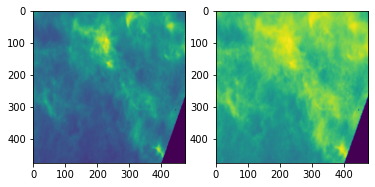

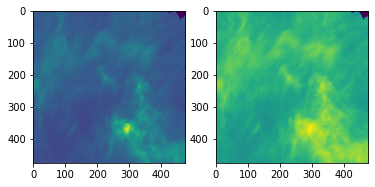

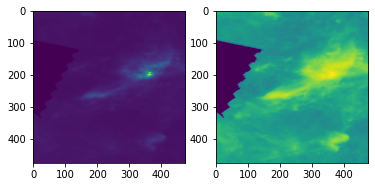

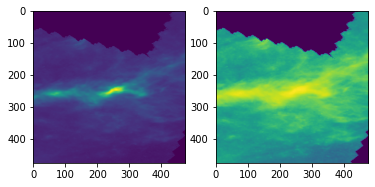

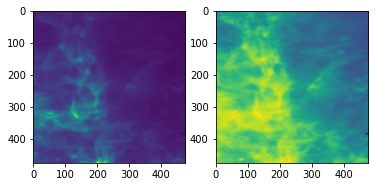

...

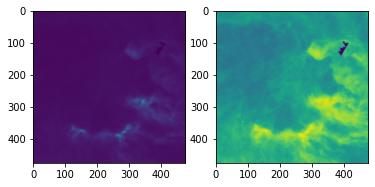

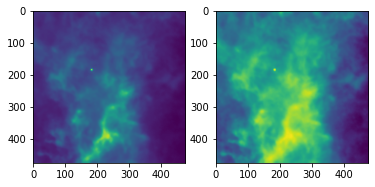

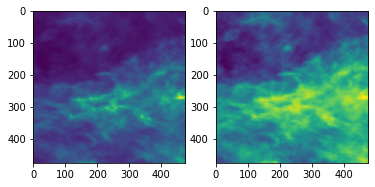

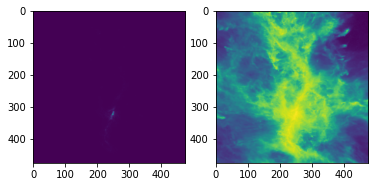

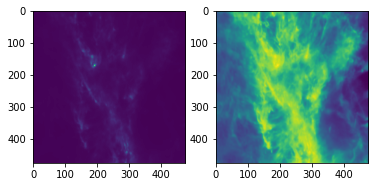

In [41]:
for file in files:
    
    arr_name = file.split("/")[9]
    
    arr = np.load(file)
    arr = np.array(arr, dtype = np.float32)
    
    
    log_arr = np.log(arr)
    log_median = np.median(log_arr)
    
    arctan_arr = np.arctan(log_arr - log_median)
    
    norm_arr = (arctan_arr - np.mean(arctan_arr))/np.std(arctan_arr)
    
    fig,ax = plt.subplots(1,2)
    
    ax[0].imshow(arr)
    ax[1].imshow(norm_arr)
    
    np.save("/home/filament/Downloads/semantic_segmentation/data/VOCdevkit/VOC2012/fil_norm_data/%s"%(arr_name),norm_arr)
    
    

In [26]:
arr = np.load(files[0])

In [27]:
arr = np.array(arr, dtype = np.float32)

In [28]:
log_arr = np.log(arr)
log_median = np.median(log_arr)
# log_mean = np.mean(log_arr)
# log_std = np.std(log_arr)

arctan_arr = np.arctan(log_arr - log_median)

norm_arr = (arctan_arr - np.mean(arctan_arr))/np.std(arctan_arr)

/home/filament/.pyenv/versions/3.7.11/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log
  """Entry point for launching an IPython kernel.


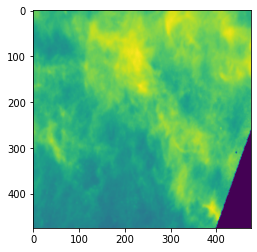

In [33]:
plt.imshow(norm_arr)

In [62]:
img_array = np.array(img)
img_log_array = np.log(img_array)
# std = np.std(img_log_array)
median = np.median(img_log_array)
mean = np.mean(img_log_array)

arctan_array = np.arctan((img_log_array - median))

flat_array = ((arctan_array - np.mean(arctan_array))/np.std(arctan_array))

In [77]:
flat_img_array = flat_array*42 + 128

In [78]:
a = Image.fromarray(np.uint8(flat_img_array)).convert('L')

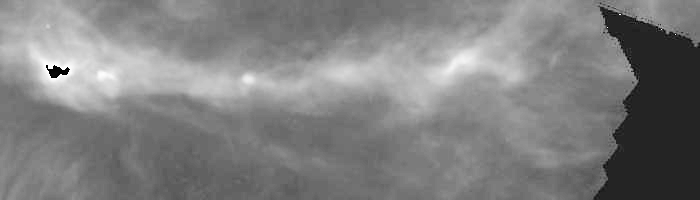

In [79]:
a

(array([   55., 13868.,   415.,  5067., 51036., 39174., 17264., 10314.,
         2201.,   606.]),
 array([-3.293   , -2.633   , -1.973   , -1.3125  , -0.6523  ,  0.007812,
         0.668   ,  1.328   ,  1.988   ,  2.648   ,  3.309   ],
       dtype=float16),
 <BarContainer object of 10 artists>)

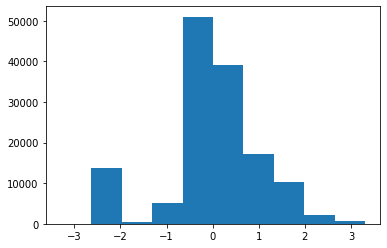

In [64]:
plt.hist(flat_array.ravel())